#  PRCP-1008-NBAShotSelection - NBA Shot Selection                 

## Team ID: PTID-CDS-APR21-1119 

-> This is a Basketball shot selection Data Set. Using 20+ years of data on the dunks and misses, the target is to predict which shots will go through the net and which doesn’t.

* 1 -> shot made

* 0 -> shot missed

# 1. IMPORTING LIBRARIES

In [1]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport as pr
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn.feature_selection import VarianceThreshold
import pylab
from scipy import stats
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from catboost import CatBoostClassifier
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

ModuleNotFoundError: No module named 'catboost'

# 2. IMPORTING DATASET

In [3]:
df = pd.read_csv("NBSData.csv")


In [4]:
df.head()

,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,period,...,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id
0,Jump Shot,Jump Shot,10,20000012,33.9723,167,72,-118.1028,10,1,...,2PT Field Goal,Right Side(R),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,31-10-2000,LAL @ POR,POR,1
1,Jump Shot,Jump Shot,12,20000012,34.0443,-157,0,-118.4268,10,1,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,31-10-2000,LAL @ POR,POR,2
2,Jump Shot,Jump Shot,35,20000012,33.9093,-101,135,-118.3708,7,1,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,31-10-2000,LAL @ POR,POR,3
3,Jump Shot,Jump Shot,43,20000012,33.8693,138,175,-118.1318,6,1,...,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,31-10-2000,LAL @ POR,POR,4
4,Driving Dunk Shot,Dunk,155,20000012,34.0443,0,0,-118.2698,6,2,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,31-10-2000,LAL @ POR,POR,5


# 3. EDA

In [4]:
profile_report = pr(df)
profile_report

Summarize dataset:   0%|          | 0/38 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Observation

### Variable types
* Categorical = 14

* Numerical =11

### Categorical
1.action_type (ordinal) -> action_type has a high cardinality -> No missing values nd zeros

2.combined_shot_type (nominal) -> High corelation with action_type,team_name,team_id -> No missing values and zeros

3.playoffs -> High corelation with game_id -> no missing values and zeros

4.season (ordinal) -> High corelation with team_name and team_id -> no missing values

5.shot_made_flag (TARGET VARIABLE) -> High corelation with team_name and team_id -> 5000 missing values (16.3%)

6.shot_type (nominal) -> High corelation with shot-zone_rane,team_id,team_name,shot_zone_basic -> No missing values

7.shot_zone_area (nominal) -> High corelation with team_name and team_id -> No missing values

8.shot_zone_basic (nominal) -> High corelation with shot_type,taem_name,team_id -> No missing values

9.shot_zone_range (nominal) -> High corelation with shot_type,taem_name,team_id -> No missing values

10.team_id -> REJECTED

11.team_name -> REJECTED

12.game_date (ordinal) -> High cardinality(High-cardinality refers to columns with values that are very uncommon or unique)

13.matchup (nominal) -> High cardinality -> High corelation with opponent,team_name,team_id

14.opponent (nominal) -> High corelation with team_name,team_id,matchup

### Numerical
1.game_event_id -> High corelation with period -> No missing values

2.game_id -> High corelation with playoff -> No missing values and zeros

3.lat -> High corelation with loc_y -> no missing values and zeros

4.loc_x -> High corelation with lon -> zeros are present (5475 zeros(17.8%))

5.loc_y -> High corelation with lat -> zeros are present (5599 zeros(18.25))

6.lon -> High corelation with loc_x -> No missing values and zeros

7.minutes_remaining -> zeros are present (can be included)

8.period -> High corelation with game_event_id

9.seconds_remaining -> zeros are present (can be included)

10.shot_distance -> zeros are present (5542 zeros)

11.short_id -> uniform and unique

### 1. Dividing into numerical,discrete and categorical

In [5]:
numerical = [feature for feature in df.columns if df[feature].dtypes !='O']
discrete = [feature for feature in numerical if len(df[feature].unique())<25]
continous = [feature for feature in numerical if feature not in discrete]
categorical = [feature for feature in df.columns if feature not in numerical]

print('count_numerical : ',len(numerical))
print('count_discrte : ',len(discrete))
print('count_continous : ',len(continous))
print('count_categorical : ',len(categorical))

count_numerical :  14
count_discrte :  5
count_continous :  9
count_categorical :  11


### 2. Checkig for missing values

In [6]:
df.isnull().sum()

action_type              0
combined_shot_type       0
game_event_id            0
game_id                  0
lat                      0
loc_x                    0
loc_y                    0
lon                      0
minutes_remaining        0
period                   0
playoffs                 0
season                   0
seconds_remaining        0
shot_distance            0
shot_made_flag        5000
shot_type                0
shot_zone_area           0
shot_zone_basic          0
shot_zone_range          0
team_id                  0
team_name                0
game_date                0
matchup                  0
opponent                 0
shot_id                  0
dtype: int64

-> Here shot_made_flag is having 5000 missing values. Since shot_made_flag is the target variable we can drop those missing values

####  Removing the missing values

In [7]:
df_copy = df.dropna(subset=['shot_made_flag'])

In [8]:
df_copy.isnull().sum()

action_type           0
combined_shot_type    0
game_event_id         0
game_id               0
lat                   0
loc_x                 0
loc_y                 0
lon                   0
minutes_remaining     0
period                0
playoffs              0
season                0
seconds_remaining     0
shot_distance         0
shot_made_flag        0
shot_type             0
shot_zone_area        0
shot_zone_basic       0
shot_zone_range       0
team_id               0
team_name             0
game_date             0
matchup               0
opponent              0
shot_id               0
dtype: int64

-> sucessfully removed the null values

### 3. Visualisation

In [9]:
df_copy.columns

Index(['action_type', 'combined_shot_type', 'game_event_id', 'game_id', 'lat',
       'loc_x', 'loc_y', 'lon', 'minutes_remaining', 'period', 'playoffs',
       'season', 'seconds_remaining', 'shot_distance', 'shot_made_flag',
       'shot_type', 'shot_zone_area', 'shot_zone_basic', 'shot_zone_range',
       'team_id', 'team_name', 'game_date', 'matchup', 'opponent', 'shot_id'],
      dtype='object')

 #### a. action_type 

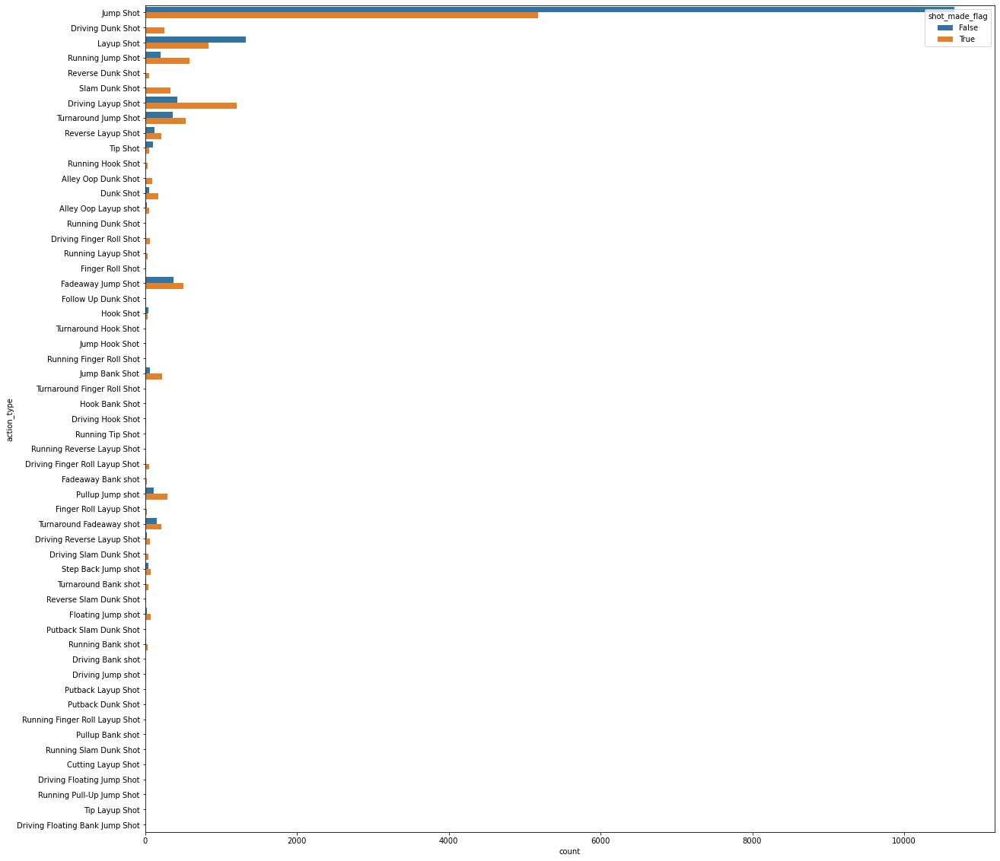

In [10]:
plt.figure(figsize=(20,20))
ax=sns.countplot(y=df_copy.action_type,hue=df_copy.shot_made_flag==1)


#### b. combined_shot_type

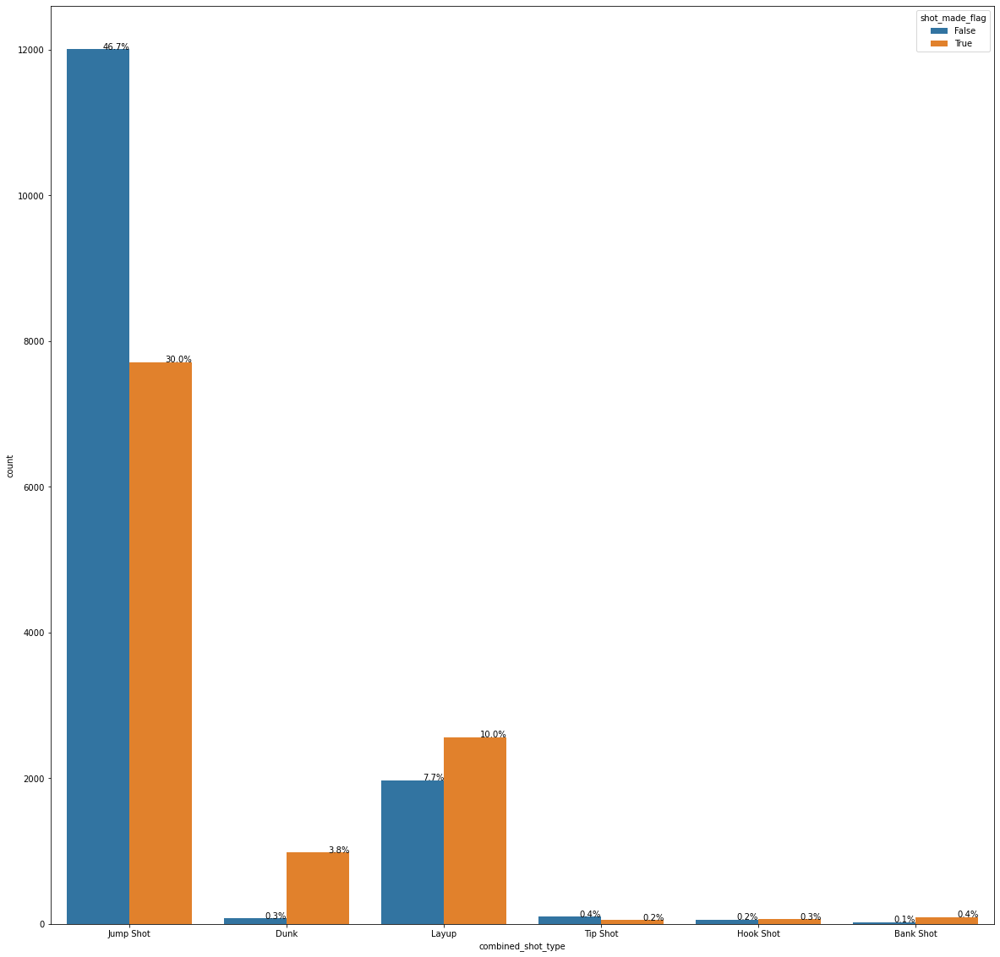

In [11]:
plt.figure(figsize=(20,20))
ax=sns.countplot(df_copy.combined_shot_type,hue=df_copy.shot_made_flag==1,)
total = float(len(df_copy))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

-> 30% of the basketed balls are due to jumb Shot.The majority majority of try with Jump Shot ended up in failure

-> But on observation out of 17.7% from the layup 10% is basketed

#### c. lon v/s lat   

Text(0.5, 1.0, 'lon vs lat')

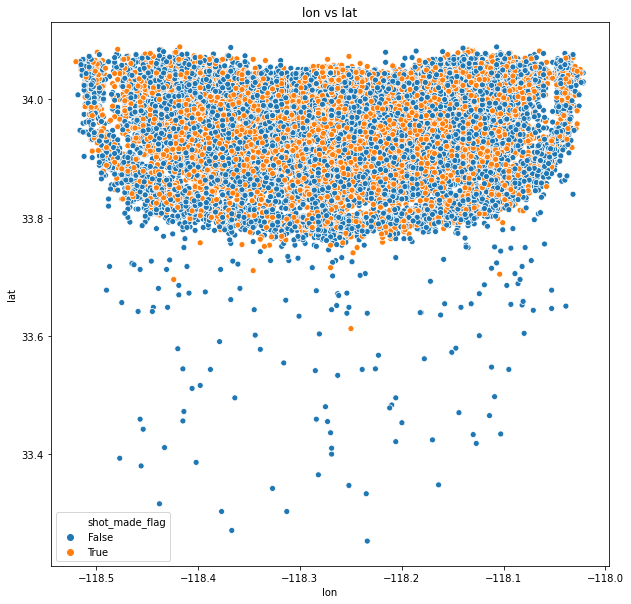

In [12]:
plt.figure(figsize=(10,10))

sns.scatterplot(x=df_copy.lon,y=df_copy.lat,hue=df_copy.shot_made_flag==1,)
plt.title('lon vs lat')


#### d. loc_x vs loc_y

Text(0.5, 1.0, 'loc_x vs loc_y')

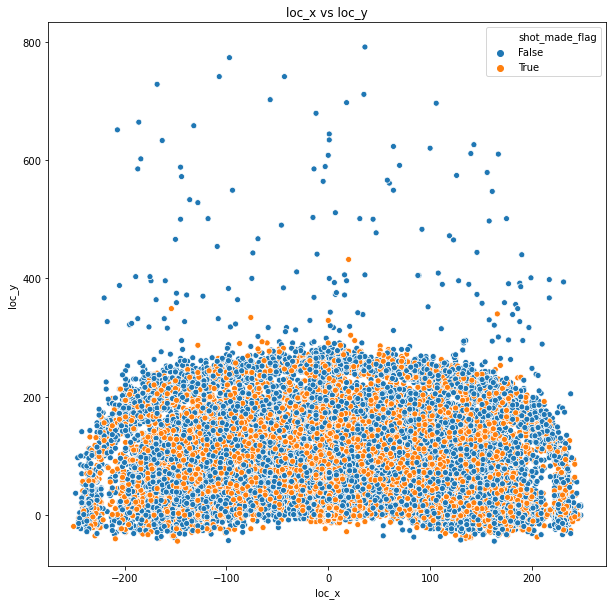

In [13]:
plt.figure(figsize=(10,10))
sns.scatterplot(x=df_copy.loc_x,y=df_copy.loc_y,hue=df_copy.shot_made_flag==1)
plt.title('loc_x vs loc_y')

#### e. Time_remaining

-> converting minutes remaining and seconds remaining into a single column called Time_remaining

In [14]:
df_copy['time_remaining'] = df_copy.minutes_remaining*60 + df_copy.seconds_remaining
df_copy.drop(columns=['minutes_remaining','seconds_remaining'],inplace=True)

#### f. playoff

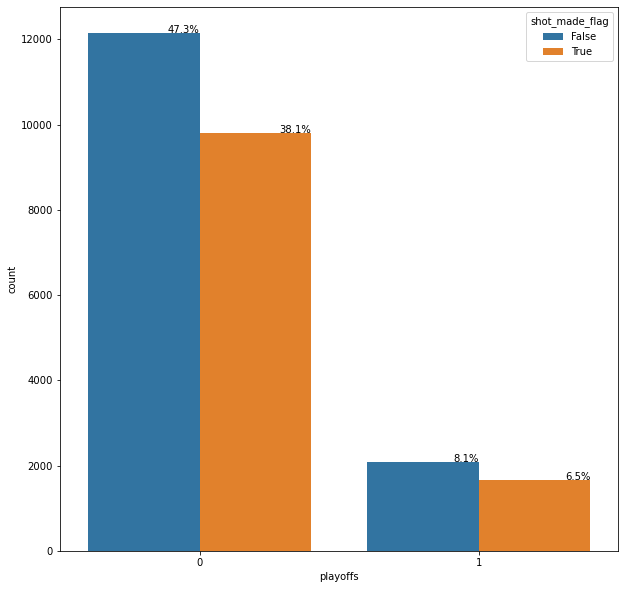

In [15]:
plt.figure(figsize=(10,10))
ax=sns.countplot(df_copy.playoffs,hue=df_copy.shot_made_flag==1,)
total = float(len(df_copy))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

-> play-off means the additional match played to decide the outcome of the contest

-> Here 38.1% is scored during the normal time 

-> But during play-off more than 80% of the tries have reached the goal 

#### g. season

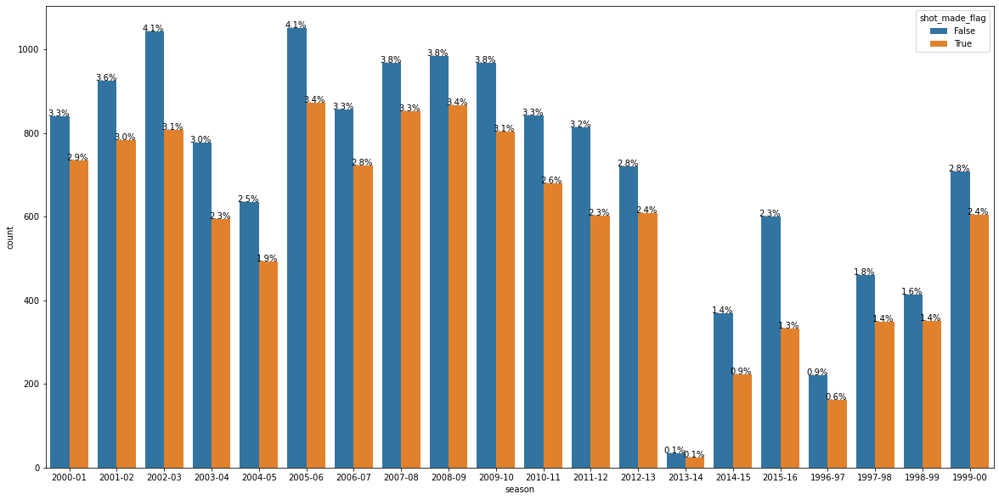

In [16]:
plt.figure(figsize=(20,10))
ax=sns.countplot(df_copy.season,hue=df_copy.shot_made_flag==1,)
total = float(len(df_copy))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

-> majority of the shot made is during the period of 2000-2013. We can see increased number of shots that made to target during this period

#### h. shot_distance vs shot_zone_range

Text(0.5, 1.0, 'shot_distance vs shot_zone_range')

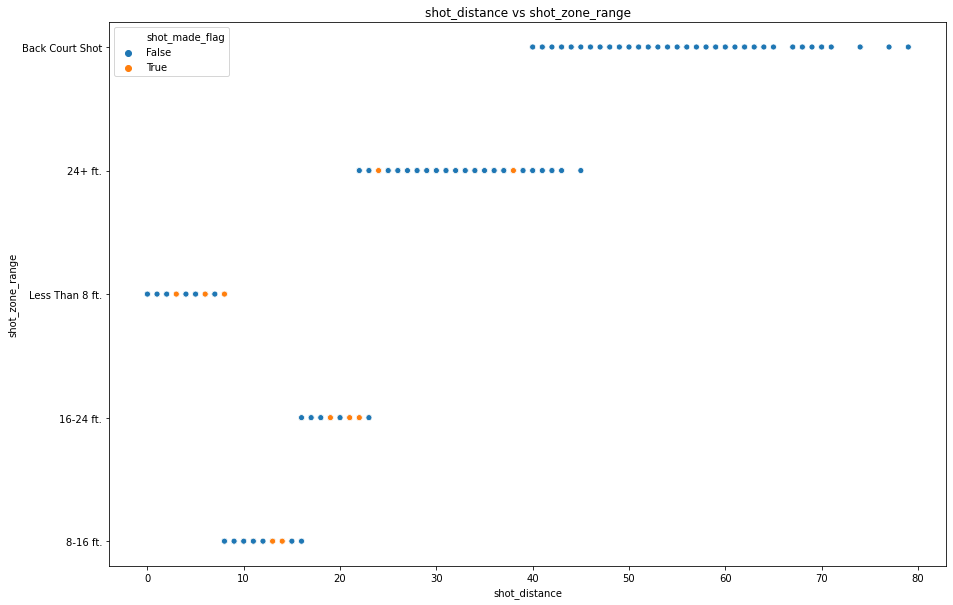

In [17]:
plt.figure(figsize=(15,10))

sns.scatterplot(x=df_copy.shot_distance,y=df_copy.shot_zone_range,hue=df_copy.shot_made_flag==1,)
plt.title('shot_distance vs shot_zone_range')


-> within 24ft and shot_distance less than 30 lies the majority of the basketed balls

#### i. shot_zone_range

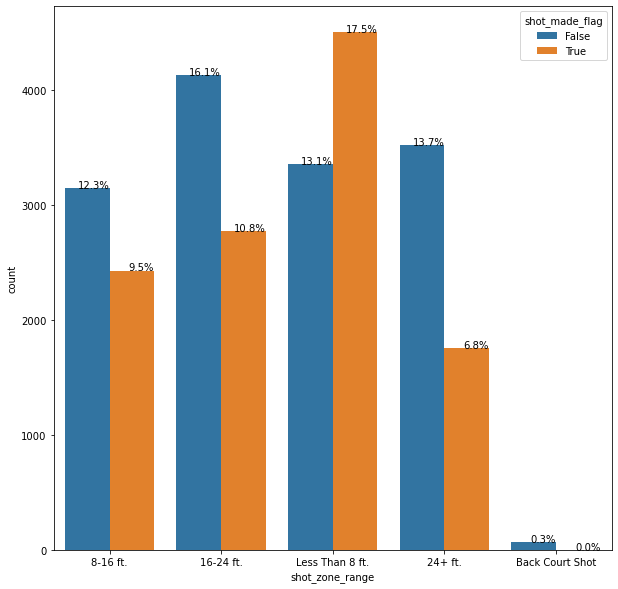

In [18]:
plt.figure(figsize=(10,10))
ax=sns.countplot(df_copy.shot_zone_range,hue=df_copy.shot_made_flag==1,)
total = float(len(df_copy))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

-> majority of the basketed shots are done within 8ft

-> when the distance increases the count of missed shots also increases

-> No balls are basketed from the Back Court

#### j . shot_type

In [19]:
df_copy.shot_type.value_counts()

2PT Field Goal    20285
3PT Field Goal     5412
Name: shot_type, dtype: int64

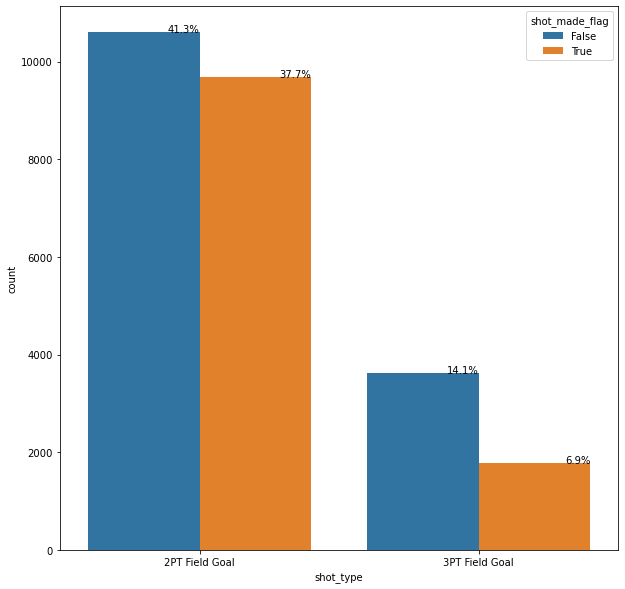

In [20]:
plt.figure(figsize=(10,10))
ax=sns.countplot(df_copy.shot_type,hue=df_copy.shot_made_flag==1,)
total = float(len(df_copy))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

-> 2PT Field Goal is having higher percentage of basketed balls

#### k. shot_zone_area vs shot_zone_basic

Text(0.5, 1.0, 'shot_zone_area vs shot_zone_basic')

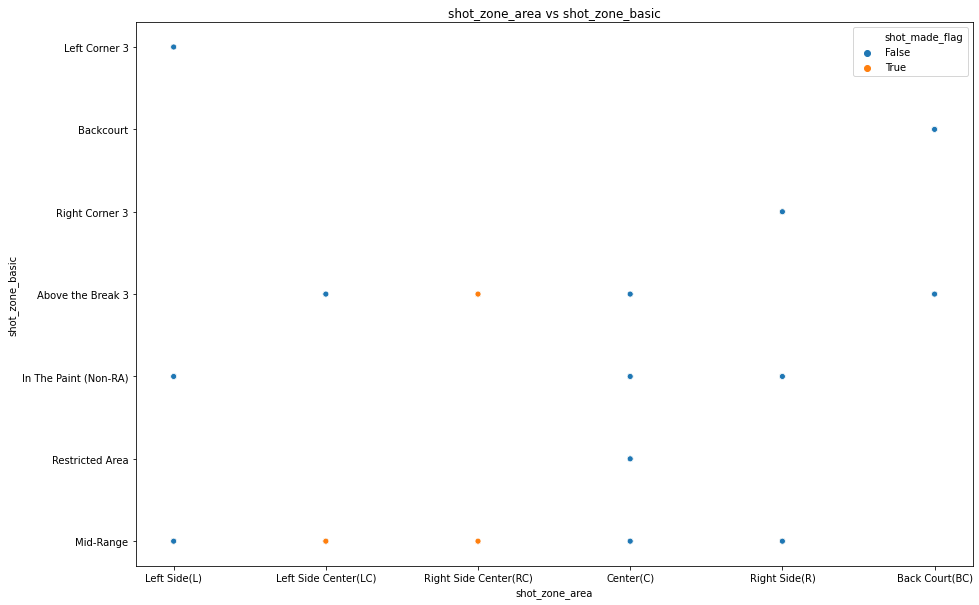

In [21]:
plt.figure(figsize=(15,10))

sns.scatterplot(x=df_copy.shot_zone_area,y=df_copy.shot_zone_basic,hue=df_copy.shot_made_flag==1,)
plt.title('shot_zone_area vs shot_zone_basic')

#### l. shot_zone_area

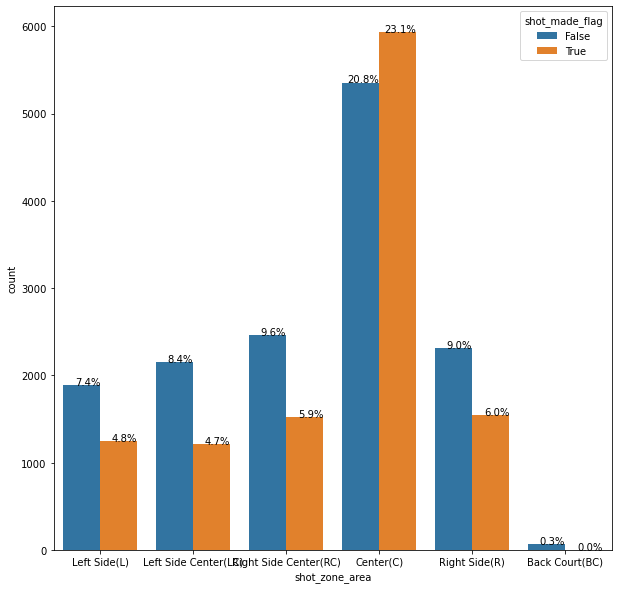

In [22]:
plt.figure(figsize=(10,10))
ax=sns.countplot(df_copy.shot_zone_area,hue=df_copy.shot_made_flag==1,)
total = float(len(df_copy))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### j. shot_zone_basic

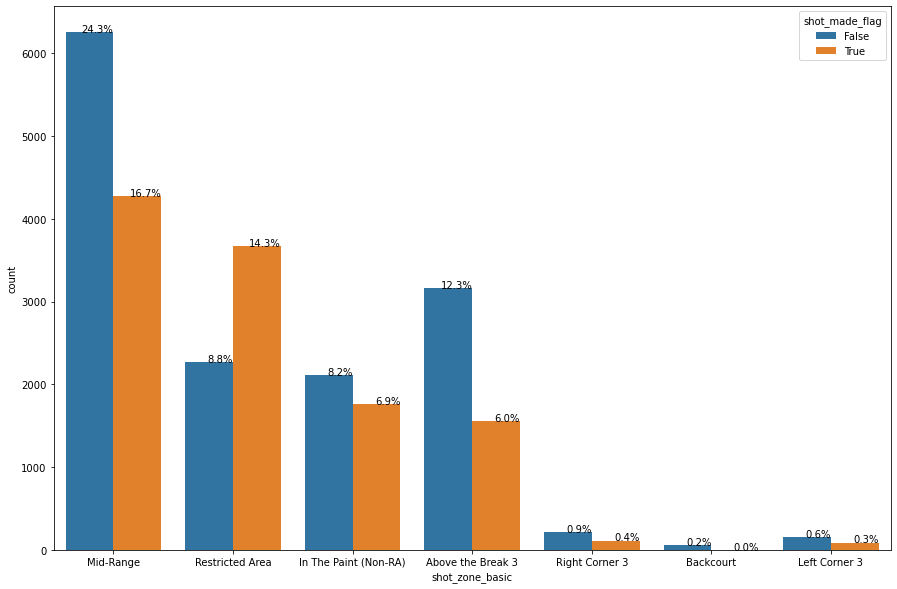

In [23]:
plt.figure(figsize=(15,10))
ax=sns.countplot(df_copy.shot_zone_basic,hue=df_copy.shot_made_flag==1,)
total = float(len(df_copy))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### k. shot_zone_area vs shot_zone_distance

Text(0.5, 1.0, 'shot_zone_area vs shot_distance')

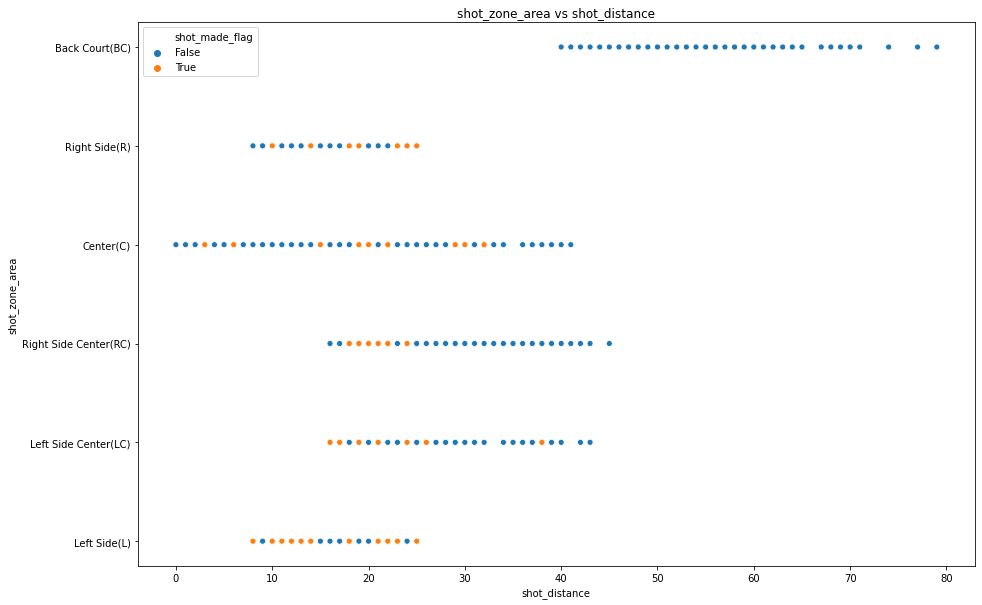

In [24]:
plt.figure(figsize=(15,10))

sns.scatterplot(x=df_copy.shot_distance,y=df_copy.shot_zone_area,hue=df_copy.shot_made_flag==1,)
plt.title('shot_zone_area vs shot_distance')

-> When the shot distance increases the percentage of the misses also increases.Beyond 40 Shot_distance every attempts ended in a failure

-> Majority of the shots from leftside within shot_distance less than 30 reaches the target

### 4. Encoding categorical variable

In [25]:
df_copy.select_dtypes(exclude='number').columns

Index(['action_type', 'combined_shot_type', 'season', 'shot_type',
       'shot_zone_area', 'shot_zone_basic', 'shot_zone_range', 'team_name',
       'game_date', 'matchup', 'opponent'],
      dtype='object')

In [26]:
# Using Labelencoder
le = LabelEncoder()
df_copy.action_type = le.fit_transform(df_copy.action_type)
df_copy.combined_shot_type = le.fit_transform(df_copy.combined_shot_type)
df_copy.season = le.fit_transform(df_copy.season) 
df_copy.shot_type = le.fit_transform(df_copy.shot_type)
df_copy.shot_zone_range = le.fit_transform(df_copy.shot_zone_range)
df_copy.shot_zone_basic = le.fit_transform(df_copy.shot_zone_basic)
df_copy.shot_zone_area = le.fit_transform(df_copy.shot_zone_area)

df_copy.game_event_id = le.fit_transform(df_copy.game_event_id)



df_copy.matchup = le.fit_transform(df_copy.matchup)
df_copy.opponent = le.fit_transform(df_copy.opponent)
df_copy.game_date = le.fit_transform(df_copy.game_date)
    

In [27]:
df_copy.head()

,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,period,playoffs,...,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id,time_remaining
1,25,3,10,20000012,34.0443,-157,0,-118.4268,1,0,...,3,4,2,1610612747,Los Angeles Lakers,309,28,25,2,622
2,25,3,33,20000012,33.9093,-101,135,-118.3708,1,0,...,2,4,0,1610612747,Los Angeles Lakers,309,28,25,3,465
3,25,3,41,20000012,33.8693,138,175,-118.1318,1,0,...,4,4,0,1610612747,Los Angeles Lakers,309,28,25,4,412
4,4,1,153,20000012,34.0443,0,0,-118.2698,2,0,...,1,5,4,1610612747,Los Angeles Lakers,309,28,25,5,379
5,25,3,242,20000012,34.0553,-145,-11,-118.4148,3,0,...,3,4,2,1610612747,Los Angeles Lakers,309,28,25,6,572


-> sucessfully converted into numerical values

# 4. Feature engineering

### 1. Feature selection

#### a. Dropping features with no impact on the outcome

-> from the observation it is clear that team_name,team_id and game_date is not having any impact in the output.so it should be removed

In [28]:
df_copy = df_copy.drop(columns=['team_name', 'game_date','team_id'])

In [29]:
df_copy.head()

,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,period,playoffs,...,shot_distance,shot_made_flag,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,matchup,opponent,shot_id,time_remaining
1,25,3,10,20000012,34.0443,-157,0,-118.4268,1,0,...,15,0.0,0,3,4,2,28,25,2,622
2,25,3,33,20000012,33.9093,-101,135,-118.3708,1,0,...,16,1.0,0,2,4,0,28,25,3,465
3,25,3,41,20000012,33.8693,138,175,-118.1318,1,0,...,22,0.0,0,4,4,0,28,25,4,412
4,4,1,153,20000012,34.0443,0,0,-118.2698,2,0,...,0,1.0,0,1,5,4,28,25,5,379
5,25,3,242,20000012,34.0553,-145,-11,-118.4148,3,0,...,14,0.0,0,3,4,2,28,25,6,572


-> sucessfully removed

#### b. Check correlation with Target variables


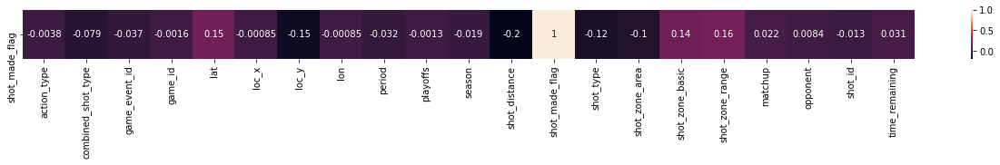

In [30]:
plt.rcParams["figure.figsize"] = 22,1
cor_dep = df_copy.corr()
sns.heatmap(cor_dep.loc[['shot_made_flag'],:],annot=True)
plt.show()

-> Apparently, matchup, shot_type, lat, shot_zone_area, shot_zone_range, shot_zone_basic, combined_shot_type and action_type are highly correlated with the target.

In [31]:
df_copy = df_copy.loc[:,['matchup','shot_type','lat','shot_zone_area','shot_zone_range','shot_zone_basic','combined_shot_type','action_type','shot_made_flag','time_remaining','shot_id']]
df_copy.head()

,matchup,shot_type,lat,shot_zone_area,shot_zone_range,shot_zone_basic,combined_shot_type,action_type,shot_made_flag,time_remaining,shot_id
1,28,0,34.0443,3,2,4,3,25,0.0,622,2
2,28,0,33.9093,2,0,4,3,25,1.0,465,3
3,28,0,33.8693,4,0,4,3,25,0.0,412,4
4,28,0,34.0443,1,4,5,1,4,1.0,379,5
5,28,0,34.0553,3,2,4,3,25,0.0,572,6


#### c. Checking corelation between features

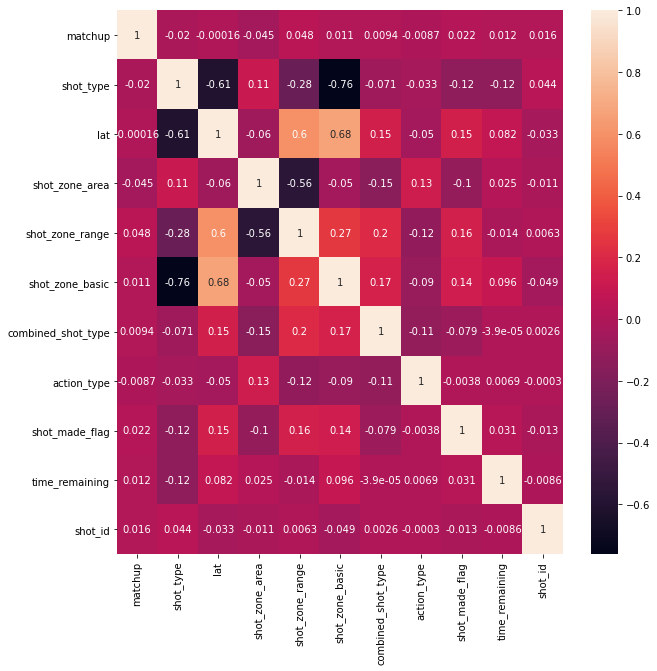

In [32]:
plt.figure(figsize=(10,10))
sns.heatmap(df_copy.corr(), annot=True)

In [33]:
drop_col2 = set()
corr_ind = df_copy.corr()
for i in range(len(corr_ind.columns)):
    for j in range(i):
        if abs(corr_ind.iloc[i,j])>0.8:
            col_name = corr_ind.columns[i]
            drop_col.add(col_name)

In [34]:
drop_col2

set()

#### d. Finding variance and dropping features with low variance(less than 0.08)

In [35]:
var = VarianceThreshold(0.07)
var.fit(df_copy)

VarianceThreshold(threshold=0.07)

In [36]:
var.get_support()

array([ True,  True, False,  True,  True,  True,  True,  True,  True,
        True,  True])

In [37]:
drop_col = df_copy.columns[var.get_support()==False]
drop_col

Index(['lat'], dtype='object')

In [38]:
df_copy.drop(columns=drop_col,inplace=True)

In [39]:
df_copy.head()

,matchup,shot_type,shot_zone_area,shot_zone_range,shot_zone_basic,combined_shot_type,action_type,shot_made_flag,time_remaining,shot_id
1,28,0,3,2,4,3,25,0.0,622,2
2,28,0,2,0,4,3,25,1.0,465,3
3,28,0,4,0,4,3,25,0.0,412,4
4,28,0,1,4,5,1,4,1.0,379,5
5,28,0,3,2,4,3,25,0.0,572,6


# 5. Data normalisation

### 1. Normality check

In [40]:
plt.rcParams["figure.figsize"] = 10,5
import pylab
def plotfigure(df_copy,feature):
    print('skewness :' , stats.skew(df_copy[feature]))
    print('kurtosis :', stats.kurtosis(df_copy[feature]))
    plt.subplot(1,2,1)
    sns.distplot(df_copy[feature])
    plt.subplot(1,2,2)
    stats.probplot(df_copy[feature],plot=pylab)
    plt.show()

matchup
skewness : 0.038650980935248054
kurtosis : -1.2310563889991648


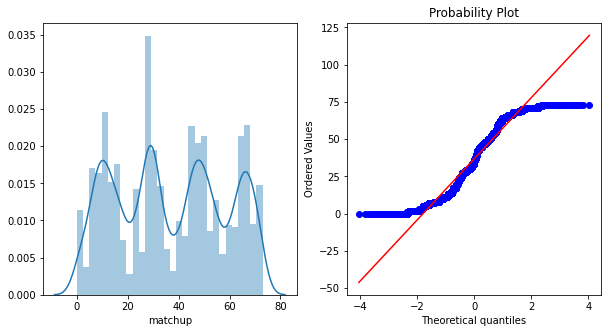

shot_type
skewness : 1.419489478983348
kurtosis : 0.014950380944417141


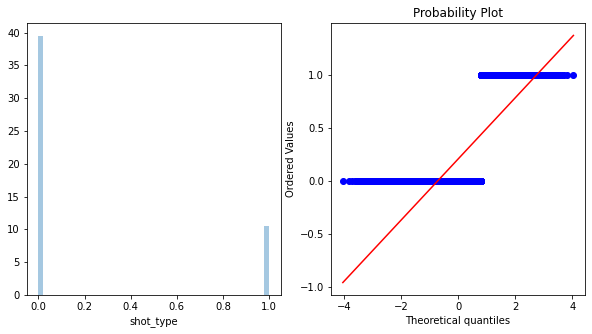

shot_zone_area
skewness : 0.4945337855764364
kurtosis : -1.302856105156973


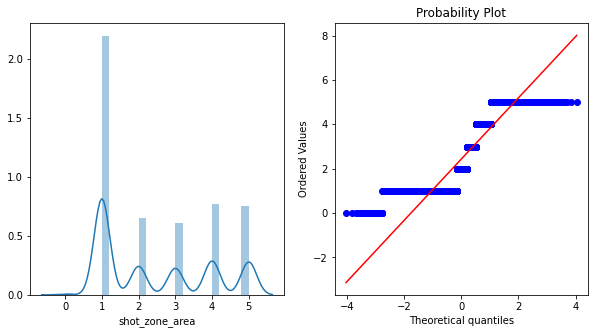

shot_zone_range
skewness : 0.26904466675973165
kurtosis : -1.4357915406110116


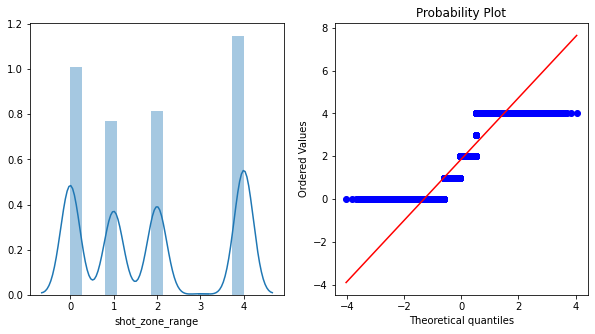

shot_zone_basic
skewness : -0.7781539642354287
kurtosis : -0.7762626149229495


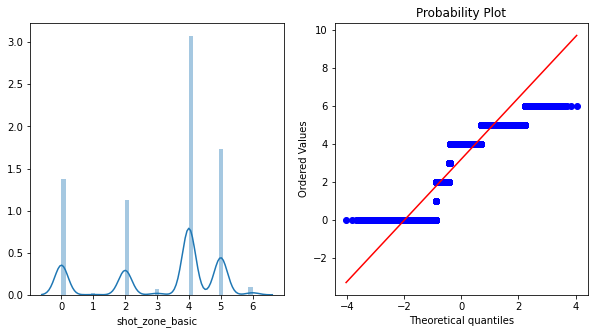

combined_shot_type
skewness : -1.3336953912419907
kurtosis : 5.66277941969833


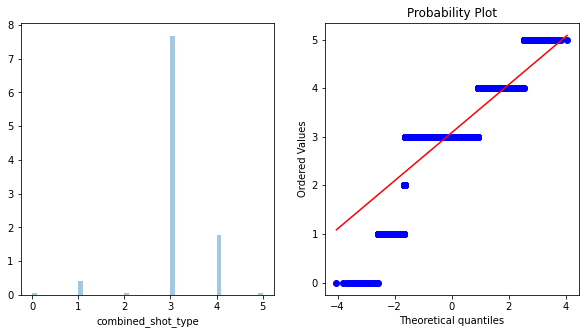

action_type
skewness : 1.0109502551934588
kurtosis : 2.6955612637316753


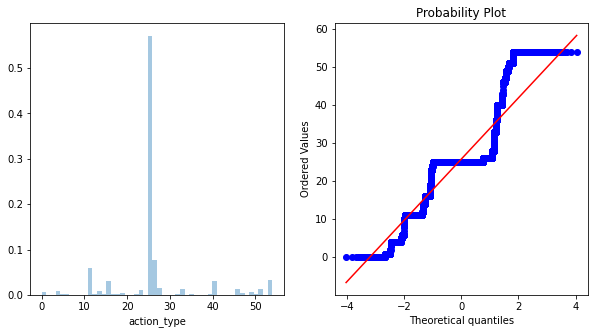

shot_made_flag
skewness : 0.21661531673546153
kurtosis : -1.9530778045555952


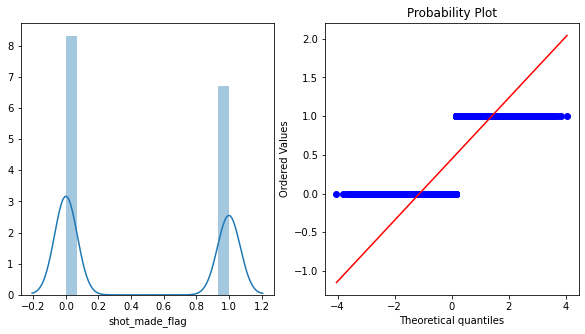

time_remaining
skewness : 0.17562580013866463
kurtosis : -1.1547209139566876


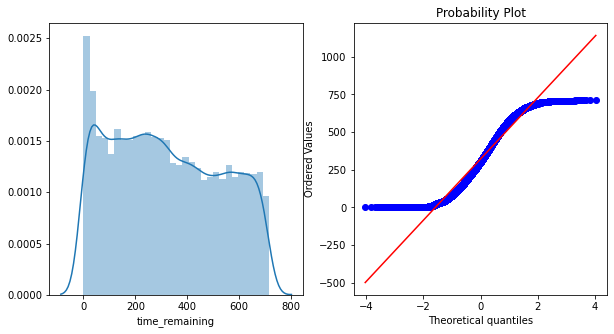

shot_id
skewness : 0.0023538239519343917
kurtosis : -1.1971712942450812


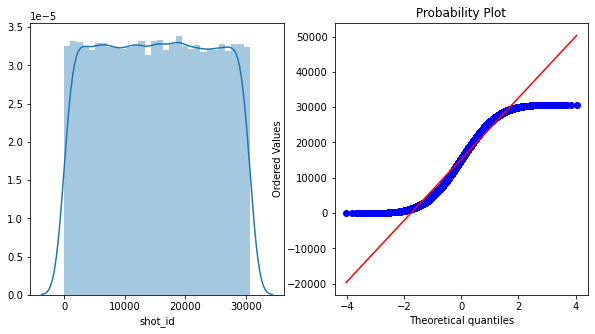

In [41]:
for i in df_copy.columns:
    print(i)
    plotfigure(df_copy,i)

-> By seeing QQ plot we are able to identify the discrete and continous features. we need to normalise the continous features if it is not in range.skewness(-1,1) and kurtosis(-2,2)

-> Here all continous variables are within the range

# 6. Defining the independent and dependent variable 

In [42]:
x = df_copy.drop(columns=['shot_made_flag'])
y = df_copy.shot_made_flag

# 7. Splitting the dataset

In [43]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=42)

# 8. Balancing the dataset

In [44]:
y.value_counts()

0.0    14232
1.0    11465
Name: shot_made_flag, dtype: int64

In [45]:
sm = SMOTE()
x_train_sm,y_train_sm = sm.fit_resample(x_train,y_train)

In [46]:
y_train_sm.value_counts()

1.0    10635
0.0    10635
Name: shot_made_flag, dtype: int64

-> Blanacing is not required

# Standard scalling

In [47]:
std = StandardScaler()
x_train_sm = std.fit_transform(x_train_sm)
x_test = std.transform(x_test)

# 9. Model selection

### 1.Cat boost

In [48]:
cat = CatBoostClassifier(iterations=2000, eval_metric = "AUC")
cat.fit(x_train_sm, y_train_sm)

Learning rate set to 0.02013
0:	total: 218ms	remaining: 7m 15s
1:	total: 240ms	remaining: 3m 59s
2:	total: 261ms	remaining: 2m 53s
3:	total: 282ms	remaining: 2m 20s
4:	total: 303ms	remaining: 2m
5:	total: 323ms	remaining: 1m 47s
6:	total: 344ms	remaining: 1m 37s
7:	total: 366ms	remaining: 1m 31s
8:	total: 388ms	remaining: 1m 25s
9:	total: 410ms	remaining: 1m 21s
10:	total: 425ms	remaining: 1m 16s
11:	total: 437ms	remaining: 1m 12s
12:	total: 451ms	remaining: 1m 8s
13:	total: 471ms	remaining: 1m 6s
14:	total: 492ms	remaining: 1m 5s
15:	total: 513ms	remaining: 1m 3s
16:	total: 534ms	remaining: 1m 2s
17:	total: 555ms	remaining: 1m 1s
18:	total: 577ms	remaining: 1m
19:	total: 598ms	remaining: 59.2s
20:	total: 623ms	remaining: 58.7s
21:	total: 637ms	remaining: 57.3s
22:	total: 650ms	remaining: 55.9s
23:	total: 673ms	remaining: 55.4s
24:	total: 694ms	remaining: 54.8s
25:	total: 716ms	remaining: 54.3s
26:	total: 735ms	remaining: 53.7s
27:	total: 757ms	remaining: 53.3s
28:	total: 778ms	remaini

247:	total: 4.94s	remaining: 34.9s
248:	total: 4.95s	remaining: 34.8s
249:	total: 4.97s	remaining: 34.8s
250:	total: 4.99s	remaining: 34.8s
251:	total: 5.01s	remaining: 34.8s
252:	total: 5.03s	remaining: 34.8s
253:	total: 5.05s	remaining: 34.7s
254:	total: 5.07s	remaining: 34.7s
255:	total: 5.09s	remaining: 34.7s
256:	total: 5.11s	remaining: 34.7s
257:	total: 5.13s	remaining: 34.7s
258:	total: 5.15s	remaining: 34.6s
259:	total: 5.17s	remaining: 34.6s
260:	total: 5.19s	remaining: 34.6s
261:	total: 5.21s	remaining: 34.6s
262:	total: 5.23s	remaining: 34.6s
263:	total: 5.25s	remaining: 34.5s
264:	total: 5.27s	remaining: 34.5s
265:	total: 5.29s	remaining: 34.5s
266:	total: 5.31s	remaining: 34.5s
267:	total: 5.33s	remaining: 34.5s
268:	total: 5.35s	remaining: 34.4s
269:	total: 5.37s	remaining: 34.4s
270:	total: 5.39s	remaining: 34.4s
271:	total: 5.41s	remaining: 34.4s
272:	total: 5.43s	remaining: 34.4s
273:	total: 5.45s	remaining: 34.3s
274:	total: 5.47s	remaining: 34.3s
275:	total: 5.5s	rem

490:	total: 9.52s	remaining: 29.2s
491:	total: 9.53s	remaining: 29.2s
492:	total: 9.55s	remaining: 29.2s
493:	total: 9.57s	remaining: 29.2s
494:	total: 9.59s	remaining: 29.1s
495:	total: 9.61s	remaining: 29.1s
496:	total: 9.63s	remaining: 29.1s
497:	total: 9.64s	remaining: 29.1s
498:	total: 9.66s	remaining: 29.1s
499:	total: 9.69s	remaining: 29.1s
500:	total: 9.7s	remaining: 29s
501:	total: 9.72s	remaining: 29s
502:	total: 9.74s	remaining: 29s
503:	total: 9.75s	remaining: 28.9s
504:	total: 9.77s	remaining: 28.9s
505:	total: 9.79s	remaining: 28.9s
506:	total: 9.82s	remaining: 28.9s
507:	total: 9.84s	remaining: 28.9s
508:	total: 9.86s	remaining: 28.9s
509:	total: 9.88s	remaining: 28.9s
510:	total: 9.9s	remaining: 28.8s
511:	total: 9.92s	remaining: 28.8s
512:	total: 9.94s	remaining: 28.8s
513:	total: 9.96s	remaining: 28.8s
514:	total: 9.98s	remaining: 28.8s
515:	total: 10s	remaining: 28.7s
516:	total: 10s	remaining: 28.7s
517:	total: 10s	remaining: 28.7s
518:	total: 10.1s	remaining: 28.7s

728:	total: 13.8s	remaining: 24.1s
729:	total: 13.8s	remaining: 24.1s
730:	total: 13.9s	remaining: 24.1s
731:	total: 13.9s	remaining: 24s
732:	total: 13.9s	remaining: 24s
733:	total: 13.9s	remaining: 24s
734:	total: 13.9s	remaining: 23.9s
735:	total: 13.9s	remaining: 23.9s
736:	total: 13.9s	remaining: 23.9s
737:	total: 14s	remaining: 23.9s
738:	total: 14s	remaining: 23.9s
739:	total: 14s	remaining: 23.8s
740:	total: 14s	remaining: 23.8s
741:	total: 14s	remaining: 23.8s
742:	total: 14.1s	remaining: 23.8s
743:	total: 14.1s	remaining: 23.8s
744:	total: 14.1s	remaining: 23.7s
745:	total: 14.1s	remaining: 23.7s
746:	total: 14.1s	remaining: 23.7s
747:	total: 14.1s	remaining: 23.7s
748:	total: 14.1s	remaining: 23.6s
749:	total: 14.2s	remaining: 23.6s
750:	total: 14.2s	remaining: 23.6s
751:	total: 14.2s	remaining: 23.6s
752:	total: 14.2s	remaining: 23.5s
753:	total: 14.2s	remaining: 23.5s
754:	total: 14.2s	remaining: 23.5s
755:	total: 14.3s	remaining: 23.5s
756:	total: 14.3s	remaining: 23.4s
7

975:	total: 18.3s	remaining: 19.2s
976:	total: 18.3s	remaining: 19.1s
977:	total: 18.3s	remaining: 19.1s
978:	total: 18.3s	remaining: 19.1s
979:	total: 18.3s	remaining: 19.1s
980:	total: 18.3s	remaining: 19.1s
981:	total: 18.4s	remaining: 19s
982:	total: 18.4s	remaining: 19s
983:	total: 18.4s	remaining: 19s
984:	total: 18.4s	remaining: 19s
985:	total: 18.4s	remaining: 19s
986:	total: 18.5s	remaining: 18.9s
987:	total: 18.5s	remaining: 18.9s
988:	total: 18.5s	remaining: 18.9s
989:	total: 18.5s	remaining: 18.9s
990:	total: 18.5s	remaining: 18.9s
991:	total: 18.6s	remaining: 18.9s
992:	total: 18.6s	remaining: 18.8s
993:	total: 18.6s	remaining: 18.8s
994:	total: 18.6s	remaining: 18.8s
995:	total: 18.6s	remaining: 18.8s
996:	total: 18.6s	remaining: 18.8s
997:	total: 18.7s	remaining: 18.7s
998:	total: 18.7s	remaining: 18.7s
999:	total: 18.7s	remaining: 18.7s
1000:	total: 18.7s	remaining: 18.7s
1001:	total: 18.7s	remaining: 18.7s
1002:	total: 18.8s	remaining: 18.6s
1003:	total: 18.8s	remainin

1212:	total: 22.6s	remaining: 14.6s
1213:	total: 22.6s	remaining: 14.6s
1214:	total: 22.6s	remaining: 14.6s
1215:	total: 22.6s	remaining: 14.6s
1216:	total: 22.6s	remaining: 14.6s
1217:	total: 22.6s	remaining: 14.5s
1218:	total: 22.6s	remaining: 14.5s
1219:	total: 22.7s	remaining: 14.5s
1220:	total: 22.7s	remaining: 14.5s
1221:	total: 22.7s	remaining: 14.4s
1222:	total: 22.7s	remaining: 14.4s
1223:	total: 22.7s	remaining: 14.4s
1224:	total: 22.7s	remaining: 14.4s
1225:	total: 22.7s	remaining: 14.4s
1226:	total: 22.7s	remaining: 14.3s
1227:	total: 22.8s	remaining: 14.3s
1228:	total: 22.8s	remaining: 14.3s
1229:	total: 22.8s	remaining: 14.3s
1230:	total: 22.8s	remaining: 14.3s
1231:	total: 22.8s	remaining: 14.2s
1232:	total: 22.8s	remaining: 14.2s
1233:	total: 22.9s	remaining: 14.2s
1234:	total: 22.9s	remaining: 14.2s
1235:	total: 22.9s	remaining: 14.2s
1236:	total: 22.9s	remaining: 14.1s
1237:	total: 22.9s	remaining: 14.1s
1238:	total: 22.9s	remaining: 14.1s
1239:	total: 23s	remaining: 

1448:	total: 26.4s	remaining: 10s
1449:	total: 26.4s	remaining: 10s
1450:	total: 26.4s	remaining: 9.99s
1451:	total: 26.4s	remaining: 9.97s
1452:	total: 26.4s	remaining: 9.95s
1453:	total: 26.4s	remaining: 9.93s
1454:	total: 26.5s	remaining: 9.91s
1455:	total: 26.5s	remaining: 9.89s
1456:	total: 26.5s	remaining: 9.87s
1457:	total: 26.5s	remaining: 9.85s
1458:	total: 26.5s	remaining: 9.83s
1459:	total: 26.5s	remaining: 9.81s
1460:	total: 26.5s	remaining: 9.79s
1461:	total: 26.6s	remaining: 9.77s
1462:	total: 26.6s	remaining: 9.75s
1463:	total: 26.6s	remaining: 9.73s
1464:	total: 26.6s	remaining: 9.71s
1465:	total: 26.6s	remaining: 9.7s
1466:	total: 26.6s	remaining: 9.68s
1467:	total: 26.7s	remaining: 9.66s
1468:	total: 26.7s	remaining: 9.64s
1469:	total: 26.7s	remaining: 9.63s
1470:	total: 26.7s	remaining: 9.61s
1471:	total: 26.7s	remaining: 9.59s
1472:	total: 26.8s	remaining: 9.57s
1473:	total: 26.8s	remaining: 9.55s
1474:	total: 26.8s	remaining: 9.53s
1475:	total: 26.8s	remaining: 9.5

1682:	total: 30.4s	remaining: 5.73s
1683:	total: 30.4s	remaining: 5.71s
1684:	total: 30.5s	remaining: 5.69s
1685:	total: 30.5s	remaining: 5.68s
1686:	total: 30.5s	remaining: 5.66s
1687:	total: 30.5s	remaining: 5.64s
1688:	total: 30.5s	remaining: 5.62s
1689:	total: 30.6s	remaining: 5.6s
1690:	total: 30.6s	remaining: 5.59s
1691:	total: 30.6s	remaining: 5.57s
1692:	total: 30.6s	remaining: 5.55s
1693:	total: 30.6s	remaining: 5.53s
1694:	total: 30.6s	remaining: 5.51s
1695:	total: 30.6s	remaining: 5.49s
1696:	total: 30.7s	remaining: 5.47s
1697:	total: 30.7s	remaining: 5.46s
1698:	total: 30.7s	remaining: 5.44s
1699:	total: 30.7s	remaining: 5.42s
1700:	total: 30.7s	remaining: 5.4s
1701:	total: 30.8s	remaining: 5.38s
1702:	total: 30.8s	remaining: 5.37s
1703:	total: 30.8s	remaining: 5.35s
1704:	total: 30.8s	remaining: 5.33s
1705:	total: 30.8s	remaining: 5.31s
1706:	total: 30.8s	remaining: 5.29s
1707:	total: 30.9s	remaining: 5.28s
1708:	total: 30.9s	remaining: 5.26s
1709:	total: 30.9s	remaining: 

1914:	total: 34.1s	remaining: 1.51s
1915:	total: 34.1s	remaining: 1.49s
1916:	total: 34.1s	remaining: 1.48s
1917:	total: 34.1s	remaining: 1.46s
1918:	total: 34.1s	remaining: 1.44s
1919:	total: 34.2s	remaining: 1.42s
1920:	total: 34.2s	remaining: 1.41s
1921:	total: 34.2s	remaining: 1.39s
1922:	total: 34.2s	remaining: 1.37s
1923:	total: 34.2s	remaining: 1.35s
1924:	total: 34.2s	remaining: 1.33s
1925:	total: 34.3s	remaining: 1.32s
1926:	total: 34.3s	remaining: 1.3s
1927:	total: 34.3s	remaining: 1.28s
1928:	total: 34.3s	remaining: 1.26s
1929:	total: 34.3s	remaining: 1.25s
1930:	total: 34.4s	remaining: 1.23s
1931:	total: 34.4s	remaining: 1.21s
1932:	total: 34.4s	remaining: 1.19s
1933:	total: 34.4s	remaining: 1.17s
1934:	total: 34.4s	remaining: 1.16s
1935:	total: 34.5s	remaining: 1.14s
1936:	total: 34.5s	remaining: 1.12s
1937:	total: 34.5s	remaining: 1.1s
1938:	total: 34.5s	remaining: 1.08s
1939:	total: 34.5s	remaining: 1.07s
1940:	total: 34.5s	remaining: 1.05s
1941:	total: 34.6s	remaining: 

In [49]:
y_pred = cat.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[3053  544]
 [1515 1313]]
0.6795330739299611
              precision    recall  f1-score   support

         0.0       0.67      0.85      0.75      3597
         1.0       0.71      0.46      0.56      2828

    accuracy                           0.68      6425
   macro avg       0.69      0.66      0.65      6425
weighted avg       0.69      0.68      0.67      6425



### 2. Logistic regression

In [50]:
log = LogisticRegression()
log.fit(x_train_sm,y_train_sm)
y_pred = log.predict(x_test)

print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[2045 1552]
 [1174 1654]]
0.5757198443579766
              precision    recall  f1-score   support

         0.0       0.64      0.57      0.60      3597
         1.0       0.52      0.58      0.55      2828

    accuracy                           0.58      6425
   macro avg       0.58      0.58      0.57      6425
weighted avg       0.58      0.58      0.58      6425



### 3. XGboost

In [51]:
xg = XGBClassifier( random_state=50,
                max_depth=2,
                n_estimators=150,
                learning_rate=0.1,
                min_child_weight=1,
                subsample=0.88,
                reg_lambda=1,
                reg_alpha=1)
xg.fit(x_train_sm,y_train_sm)
y_pred1 = xg.predict(x_test)

print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[16:03:28] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[3078  519]
 [1510 1318]]
0.6842023346303502
              precision    recall  f1-score   support

         0.0       0.67      0.86      0.75      3597
         1.0       0.72      0.47      0.57      2828

    accuracy                           0.68      6425
   macro avg       0.69      0.66      0.66      6425
weighted avg       0.69      0.68      0.67      6425



### 4. Randomforest

In [52]:
rand = RandomForestClassifier(random_state=42,
        n_estimators=36,
        max_depth=10)
rand.fit(x_train_sm,y_train_sm)
y_pred1 = rand.predict(x_test)

In [53]:
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[3107  490]
 [1533 1295]]
0.685136186770428
              precision    recall  f1-score   support

         0.0       0.67      0.86      0.75      3597
         1.0       0.73      0.46      0.56      2828

    accuracy                           0.69      6425
   macro avg       0.70      0.66      0.66      6425
weighted avg       0.69      0.69      0.67      6425



In [54]:
pd.crosstab(y_test,y_pred1)

col_0,0.0,1.0
shot_made_flag,,
0.0,3107,490
1.0,1533,1295


### 5. Naive_bayes

In [55]:
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import CategoricalNB

In [56]:
# GaussianNB
ga = GaussianNB()

ga.fit(x_train_sm,y_train_sm)
y_pred2 = ga.predict(x_test)

In [57]:
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[2792  805]
 [1501 1327]]
0.6410894941634241
              precision    recall  f1-score   support

         0.0       0.65      0.78      0.71      3597
         1.0       0.62      0.47      0.54      2828

    accuracy                           0.64      6425
   macro avg       0.64      0.62      0.62      6425
weighted avg       0.64      0.64      0.63      6425



In [58]:
# BernoulliNB
ba = BernoulliNB()

ba.fit(x_train_sm,y_train_sm)
y_pred2 = ba.predict(x_test)

In [59]:
print(confusion_matrix(y_test,y_pred2))
print(accuracy_score(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[2139 1458]
 [1152 1676]]
0.5937743190661479
              precision    recall  f1-score   support

         0.0       0.65      0.59      0.62      3597
         1.0       0.53      0.59      0.56      2828

    accuracy                           0.59      6425
   macro avg       0.59      0.59      0.59      6425
weighted avg       0.60      0.59      0.60      6425



-> Here Random forest is having higher accuracy.

# 10. Hyperparameter tuning

In [73]:
parameters = {'max_depth': [9,10,11],
             "n_estimators": [35,36,37],
             'random_state':[41,42,43]
             }

In [ ]:
grid = GridSearchCV(rand,parameters,cv=5)
grid.fit(x_train_sm,y_train_sm)
grid.best_score_

In [ ]:
grid.best_params_

#### 1. Remodelling

In [71]:
rand = RandomForestClassifier(random_state=102,
        n_estimators=50,
        max_depth=10)
rand.fit(x_train_sm,y_train_sm)
y_pred1 = rand.predict(x_test)

In [72]:
print(confusion_matrix(y_test,y_pred1))
print(accuracy_score(y_test,y_pred1))
print(classification_report(y_test,y_pred1))

[[3103  494]
 [1543 1285]]
0.6829571984435797
              precision    recall  f1-score   support

         0.0       0.67      0.86      0.75      3597
         1.0       0.72      0.45      0.56      2828

    accuracy                           0.68      6425
   macro avg       0.70      0.66      0.66      6425
weighted avg       0.69      0.68      0.67      6425



#### 2. Checking cross validation score

In [65]:
cv_score = cross_val_score(RandomForestClassifier(),x_train,y_train,cv=8)
cv_score

array([0.63345787, 0.64051474, 0.65172271, 0.65006227, 0.64134496,
       0.63345787, 0.63760897, 0.63262765])

In [66]:
print("Maximum cv_score = ",max(cv_score))
print("Minimum cv_score = ",min(cv_score))
print("Average cv_score = ",cv_score.mean())

Maximum cv_score =  0.6517227065172271
Minimum cv_score =  0.6326276463262764
Average cv_score =  0.6400996264009963


-> By refering this we can understand that our model is not overfitted